![](img/churn_picture.png)
<h1>Client Churn Prediction</h1>


Source: https://nextommerce.com/churn-rate-benchmarks/

# TopBottom bank
You were hired as a Data Science Consultant to create a high-performance model for identifying churn customers.
At the end of your consultancy, you need to deliver to the TopBottom bank CEO a model in production, which will receive a customer base via API and develop this base through scores, which means, one more column with the probability of each customer going into churn.

# 1.0 Background

## Churn definition

There’s revenue churn rate and there’s customer churn. These are not the same.

Revenue churn is the percentage of revenue you lose in the given period. Customer churn is the percentage of customers lost in the given period.

The numbers are usually better for revenue churn than for customer churn. And this is what is usually reported for large/enterprise companies.

Revenue churn can even be negative, if  revenue from current customers (through upsells and cross sells) exceeds the value of your lost customers. 
Again, this is easier to do with large or enterprise companies than with SMBs or B2C.

### What Is Churn Rate?

The churn rate, also known as the rate of attrition or customer churn, is the rate at which customers stop doing business with an entity. It is most commonly expressed as the percentage of service subscribers who discontinue their subscriptions within a given time period.

Source: https://www.investopedia.com/terms/c/churnrate.asp

## Lack of data

There isn’t a whole lot of churn data available – and the information is often only vaguely comparable.

There’s a simple reason for that: high churn rates are bad, literally recording how many customers are up-and-leaving your service each month. Few companies are as brave to provide their data, and those that do agree to share churn rates will likely only do so if it’s anonymous, and the exact data is hidden away with a range.

# 2.0 Importing libraries

In [4]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as sns
import missingno as msno
from scipy import stats
import pickle

# disable max columns limit
pd.set_option('display.max_columns', 70)


# Disabling warnings
import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

# 3.0 Descriptive data analysis






| Feature                                       | Type                |                                       Feature Name                                          | Data Type                                        |
|:----------------------------------------------|:--------------------|:--------------------------------------------------------------------------------------------|:-------------------------------------------------|
| RowNumber                                     | Objective Feature   | number of the row                                                                           | int64                                            |
| CustomerId                                    | Objective Feature   | id of the customer                                                                          | int64                                            |
| Surname                                       | Objective Feature   | Last name of the customer                                                                   | object                                           |
| CreditScore                                   | Objective Feature   | The customer's Credit score for the consumer market                                         | int64                                            |
| Geography                                     | Objective Feature   | Country where the customer resides                                                          | object                                           |
| Gender                                        | Objective Feature   | The gender of the customer                                                                  | object                                           |
| Age                                           | Objective Feature   | Age of the customer                                                                         | object                                           |
| Tenure                                        | Objective Feature   | Number of months that the customer has remained active                                      | int64                                            |
| Balance                                       | Objective Feature   | The amount spent by the customer with the company TopBottom                                 | float64                                          |
| NumOfProducts                                 | Objective Feature   | The number of products purchased by the customer                                            | int64                                            |
| HasCrCard                                     | Objective Feature   | Flag indicating whether the customer has a credit card or not                               | binary                                           |
| IsActiveMember                                | Objective Feature   | Flag indicating whether the customer still has an active registration at TopBottom          | int64                                            |
| EstimatedSalary                               | Objective Feature   | Estimated monthly salary of the client                                                      | float64                                          |
| Exited                                        | Target variable     | Flag indicating whether or not the customer is in Churn                                     | int64                                            |



In [2]:
train = pd.read_csv('churn.csv')

In [3]:
train.head()

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,1,15634602,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,2,15647311,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,3,15619304,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,4,15701354,Boni,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,5,15737888,Mitchell,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0


In [4]:
train.shape

(10000, 14)

## Checking missing values

There is no null values in this dataset


<Figure size 432x288 with 0 Axes>

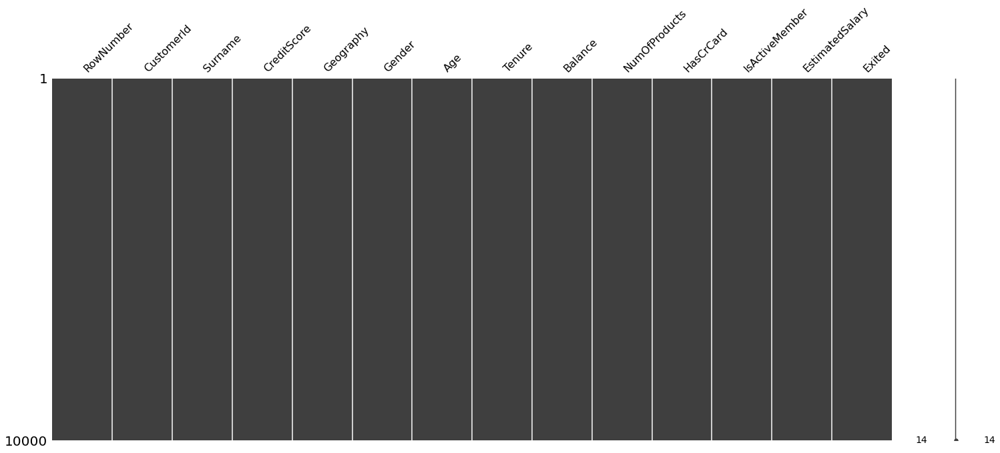

In [5]:
print('There is no null values in this dataset')

plt.figure(figsize=(6,4))
msno.matrix(train)
plt.show()

In [6]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   RowNumber        10000 non-null  int64  
 1   CustomerId       10000 non-null  int64  
 2   Surname          10000 non-null  object 
 3   CreditScore      10000 non-null  int64  
 4   Geography        10000 non-null  object 
 5   Gender           10000 non-null  object 
 6   Age              10000 non-null  int64  
 7   Tenure           10000 non-null  int64  
 8   Balance          10000 non-null  float64
 9   NumOfProducts    10000 non-null  int64  
 10  HasCrCard        10000 non-null  int64  
 11  IsActiveMember   10000 non-null  int64  
 12  EstimatedSalary  10000 non-null  float64
 13  Exited           10000 non-null  int64  
dtypes: float64(2), int64(9), object(3)
memory usage: 1.1+ MB


In [7]:
train[['CreditScore', 'Age', 'Tenure', 'Balance', 'NumOfProducts', 'EstimatedSalary']].describe()

,CreditScore,Age,Tenure,Balance,NumOfProducts,EstimatedSalary
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,650.528800,38.921800,5.012800,76485.889288,1.530200,100090.239881
std,96.653299,10.487806,2.892174,62397.405202,0.581654,57510.492818
min,350.000000,18.000000,0.000000,0.000000,1.000000,11.580000
25%,584.000000,32.000000,3.000000,0.000000,1.000000,51002.110000
50%,652.000000,37.000000,5.000000,97198.540000,1.000000,100193.915000
75%,718.000000,44.000000,7.000000,127644.240000,2.000000,149388.247500
max,850.000000,92.000000,10.000000,250898.090000,4.000000,199992.480000


### Checking how far the distributions are from the normal one

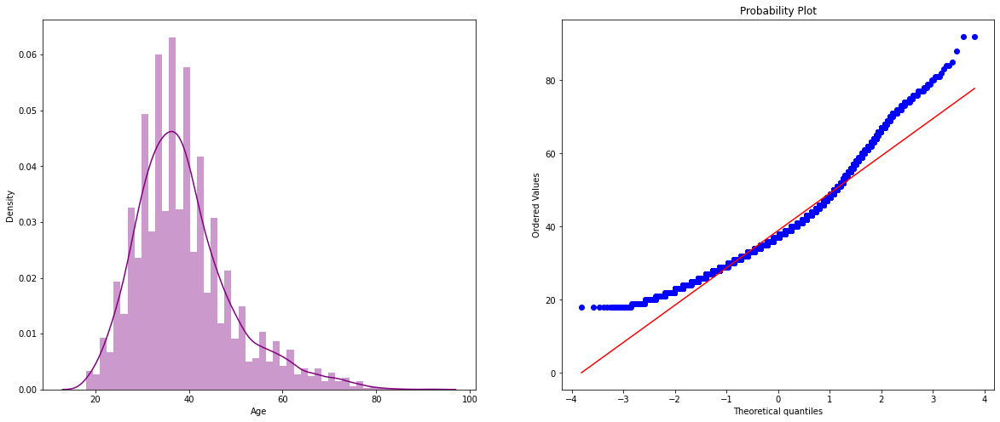

In [8]:
# sets the figure size in inches
plt.figure(figsize=(20,8))

plt.subplot(1,2,1)
sns.distplot(train['Age'], color="purple")
#plt.xlim(130,200)

plt.subplot(1,2,2)
# Probability plot
stats.probplot(train['Age'], plot=plt)

plt.show()

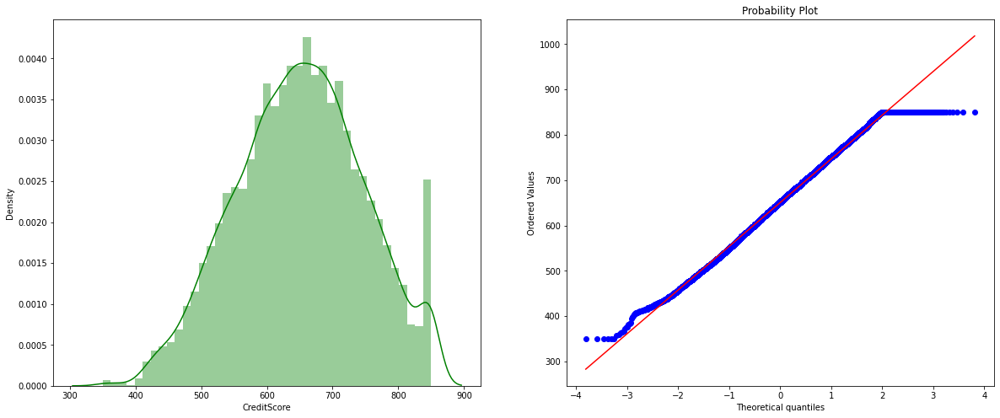

In [9]:
# sets the figure size in inches
plt.figure(figsize=(20,8))

plt.subplot(1,2,1)
sns.distplot(train['CreditScore'], color="green")
#plt.xlim(130,200)

plt.subplot(1,2,2)
# Probability plot
stats.probplot(train['CreditScore'], plot=plt)

plt.show()

## Some strange data:

- The minimum estimated salary of 11.58

## Functions

In [10]:
def boxplot(df,x,y,x_text=None,y_text=None,title=None, x_lim=None, y_lim=None, palette=None):

  plt.style.use("ggplot")  
  ax = sns.boxplot(x=x, y=y, data=df, palette=palette)
  ax.set_xlabel(x_text, fontsize=16)
  ax.set_ylabel(y_text, fontsize=16)
  ax.set_xlim(x_lim)
  ax.set_ylim(y_lim)
  plt.title(title, fontsize=18)

In [11]:
def histplot(x, titulo=None, x_texto=None, y_texto=None, cor=None, grade=False):

  plt.style.use("ggplot")
  #plt.figure(figsize = (14, 10))
  sns.histplot(x = x, edgecolor='black', alpha=0.3, kde=1, color=cor)
  plt.axvline(x=x.mean(), color='red', linestyle='solid', linewidth=2, label="Média")
  plt.axvline(x=x.median(), color='green', linestyle='solid', linewidth=2, label="Mediana")
  plt.axvline(x=x.value_counts().index[0], color='yellow', linestyle='solid', linewidth=2, label="Moda")
  plt.title(titulo, fontsize=16)
  plt.grid(grade)
  plt.xlabel(x_texto, fontsize=14)
  plt.ylabel(y_texto, fontsize=14)
  plt.legend()
  #plt.show()

# 3.0 Hypotheses list

## Mind Map
![](img/mind_map.png)


- **H1:** People with bad credit score are the most one in churn situation
- **H2:** Most of the customers are in a good credit score condition
- **H3:** The customers with the lowest salaries tend to be in a churn situation
- **H4:** The customers with fewer years of tenure tend to be in a churn situation
- **H5:** The quantity of the customers with balance less than 10 is very low
- **H6:** Most of the customers in churn situation are the youngest ones

# 4.0 Feature Engineering

In [12]:
df_deploy = train.copy()

## Credit score range
![](img/credit_score.jpg)

In [13]:
train['Score_cond'] = train['CreditScore'].apply(lambda x: 'Bad' if x<629 else('Fair' if 630 < x < 689 else('Good' if 690<x<719 else 'Excellent')))

In [14]:
train['Age_range'] = train['Age'].apply(lambda x: 'Young adults' if 18<=x<=29 else('Middle-aged adults' if 30<=x<=45 else 'Old-aged adults'))

# 5.0 EDA - Exploratory data analysis

## Univariate analysis

Since it's a classification problem, it's important the data is balanced


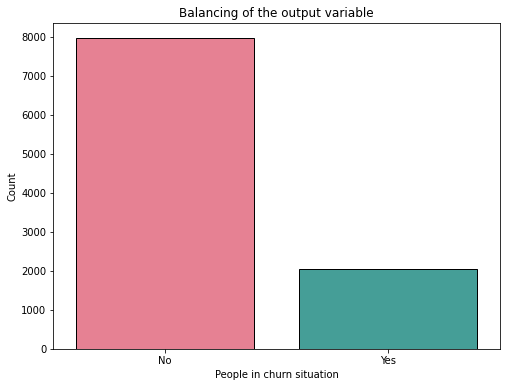

In [15]:
print("Since it's a classification problem, it's important the data is balanced")

# sets the plot size
plt.figure(figsize=(8,6))

# counts each class for the target var
ax = sns.countplot(x=train['Exited'], palette ="husl", edgecolor="black")

# sets plot features
plt.title("Balancing of the output variable")
plt.xlabel("People in churn situation")
plt.ylabel("Count")
plt.xticks(ticks=[0,1], labels=['No','Yes'])

# displays the plot
plt.show()

In [16]:
percentage_output_nochurn = round(train[train['Exited'] == 0].shape[0]/train.shape[0],2)*100
percentage_output_churn = round(train[train['Exited'] == 1].shape[0]/train.shape[0],2)*100
print('The percentage of the customers in churn and no churn is {} and {}% respectively'.format(percentage_output_churn, percentage_output_nochurn))

The percentage of the customers in churn and no churn is 20.0 and 80.0% respectively


## Credit score factors

1 - Payment history: Payment history is the most important ingredient in credit scoring, and even one missed payment can have a negative impact on your score. Lenders want to be sure that you will pay back your debt, and on time, when they are considering you for new credit. Payment history accounts for 35% of your FICO® Score☉ , the credit score used by most lenders.

2 - Credit utilization: Your credit utilization ratio is calculated by dividing the total revolving credit you are currently using by the total of all your revolving credit limits. This ratio looks at how much of your available credit you're utilizing and can give a snapshot of how reliant you are on non-cash funds. Using more than 30% of your available credit is a negative to creditors. Credit utilization accounts for 30% of your FICO® Score.

3 - Credit history length: How long you've held credit accounts makes up 15% of your FICO® Score. This includes the age of your oldest credit account, the age of your newest credit account and the average age of all your accounts. Generally, the longer your credit history, the higher your credit scores.

4 - Credit mix: People with top credit scores often carry a diverse portfolio of credit accounts, which might include a car loan, credit card, student loan, mortgage or other credit products. Credit scoring models consider the types of accounts and how many of each you have as an indication of how well you manage a wide range of credit products. Credit mix accounts for 10% of your FICO® Score.

5 - New credit: The number of credit accounts you've recently opened, as well as the number of hard inquiries lenders make when you apply for credit, accounts for 10% of your FICO® Score. Too many accounts or inquiries can indicate increased risk, and as such can hurt your credit score.


H2: Most of the customers are at least in a good credit score condition --> FALSE


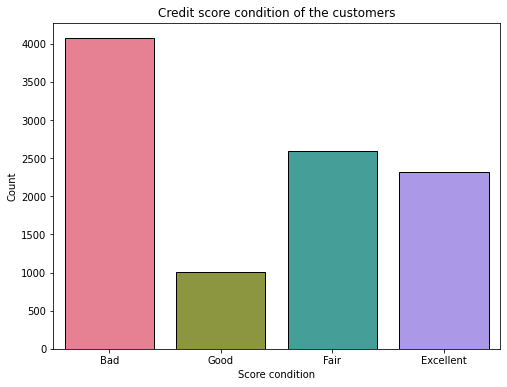

In [17]:
print("H2: Most of the customers are at least in a good credit score condition --> FALSE")

# sets the plot size
plt.figure(figsize=(8,6))

# counts each class for the target var
ax = sns.countplot(x=train['Score_cond'], palette ="husl", edgecolor="black")

# sets plot features
plt.title("Credit score condition of the customers")
plt.xlabel("Score condition")
plt.ylabel("Count")
plt.xticks(ticks=[0,1,2,3], labels=['Bad','Good','Fair', 'Excellent'])

# displays the plot
plt.show()

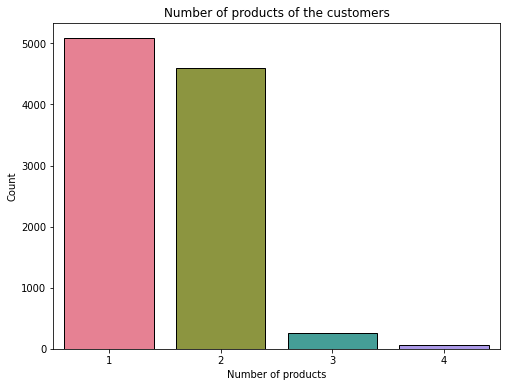

In [18]:
# sets the plot size
plt.figure(figsize=(8,6))

# counts each class for the target var
ax = sns.countplot(x=train['NumOfProducts'], palette ="husl", edgecolor="black")

# sets plot features
plt.title("Number of products of the customers")
plt.xlabel("Number of products")
plt.ylabel("Count")


# displays the plot
plt.show()

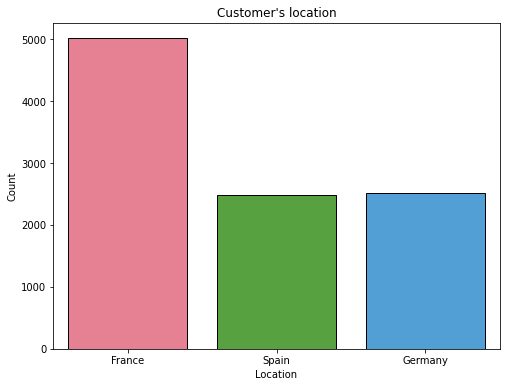

In [19]:
# sets the plot size
plt.figure(figsize=(8,6))

# counts each class for the target var
ax = sns.countplot(x=train['Geography'], palette ="husl", edgecolor="black")

# sets plot features
plt.title("Customer's location")
plt.xlabel("Location")
plt.ylabel("Count")


# displays the plot
plt.show()

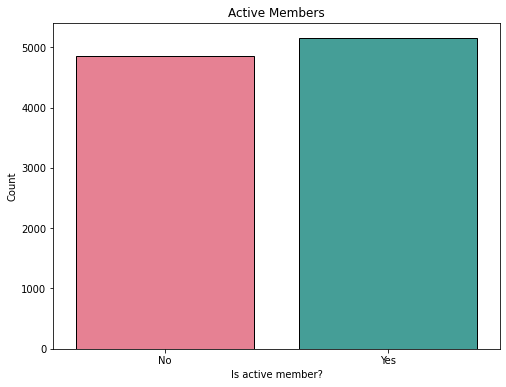

In [20]:
# sets the plot size
plt.figure(figsize=(8,6))

# counts each class for the target var
ax = sns.countplot(x=train['IsActiveMember'], palette ="husl", edgecolor="black")

# sets plot features
plt.title("Active Members")
plt.xlabel("Is active member?")
plt.ylabel("Count")
plt.xticks(ticks=[0,1], labels=['No','Yes'])

# displays the plot
plt.show()

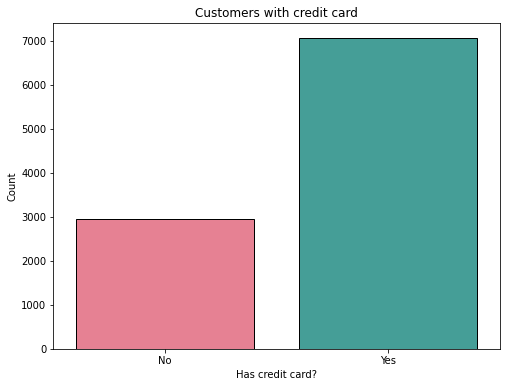

In [21]:
# sets the plot size
plt.figure(figsize=(8,6))

# counts each class for the target var
ax = sns.countplot(x=train['HasCrCard'], palette ="husl", edgecolor="black")

# sets plot features
plt.title("Customers with credit card")
plt.xlabel("Has credit card?")
plt.ylabel("Count")
plt.xticks(ticks=[0,1], labels=['No','Yes'])

# displays the plot
plt.show()

In [22]:
total_percentage_balance_less_10 = round(train[train['Balance']<10].shape[0]/train.shape[0],4)*100
print('Percentage of the customers with balance less than 10: {}%'.format(total_percentage_balance_less_10))

Percentage of the customers with balance less than 10: 36.17%


In [23]:
less_than_10 =  train['Balance'].apply(lambda x: 1 if x<10 else 0)   

H5: The quantity of the customers with balance less than 10 is very low --> FALSE


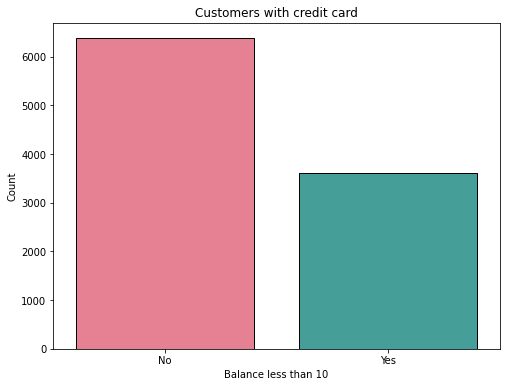

In [24]:
print('H5: The quantity of the customers with balance less than 10 is very low --> FALSE')
#  sets the plot size
plt.figure(figsize=(8,6))

# counts each class for the target var
ax = sns.countplot(x=less_than_10, palette ="husl", edgecolor="black")

# sets plot features
plt.title("Customers with credit card")
plt.xlabel("Balance less than 10")
plt.ylabel("Count")
plt.xticks(ticks=[0,1], labels=['No','Yes'])

# displays the plot
plt.show()

## Bivariate analysis

In [25]:
total_geography = train[train['Exited']==1]['Score_cond'].value_counts()
percentage_geography = pd.DataFrame(round(total_geography/train[train['Exited']==1]['Score_cond'].value_counts().sum()*100, 2)).rename(columns={'Score_cond': 'Percentage (%)'})
print('Percentage of the customers in a churn situation based on score condition')
percentage_geography

Percentage of the customers in a churn situation based on score condition


,Percentage (%)
Bad,43.40
Excellent,26.02
Fair,21.31
Good,9.28


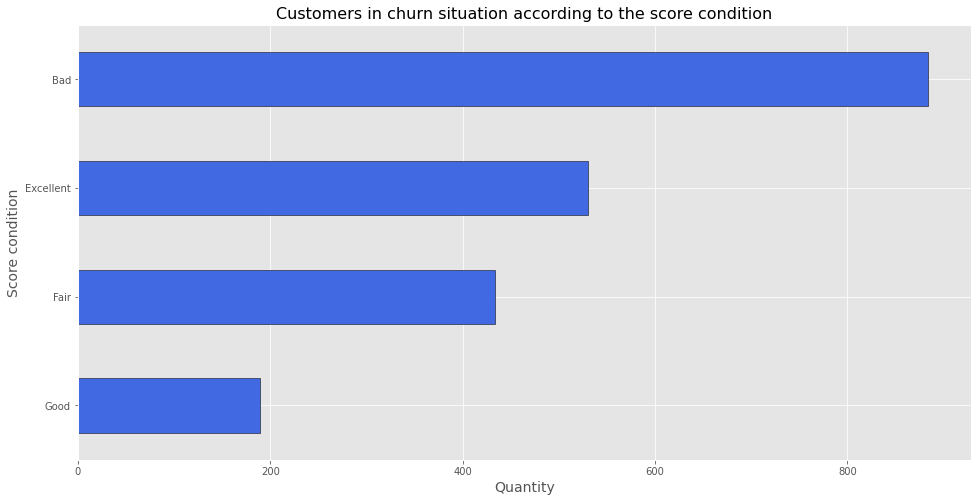

In [26]:
churn_score = train[train['Exited']==1].groupby('Score_cond').count()
plt.figure(figsize=(16,8))
plt.style.use("ggplot")  
churn_score['Exited'].sort_values(ascending=True).plot(kind='barh', color='royalblue', edgecolor='black')
plt.title('Customers in churn situation according to the score condition', fontsize=16)
plt.ylabel('Score condition', fontsize=14)
plt.xlabel('Quantity', fontsize=14)
plt.show()

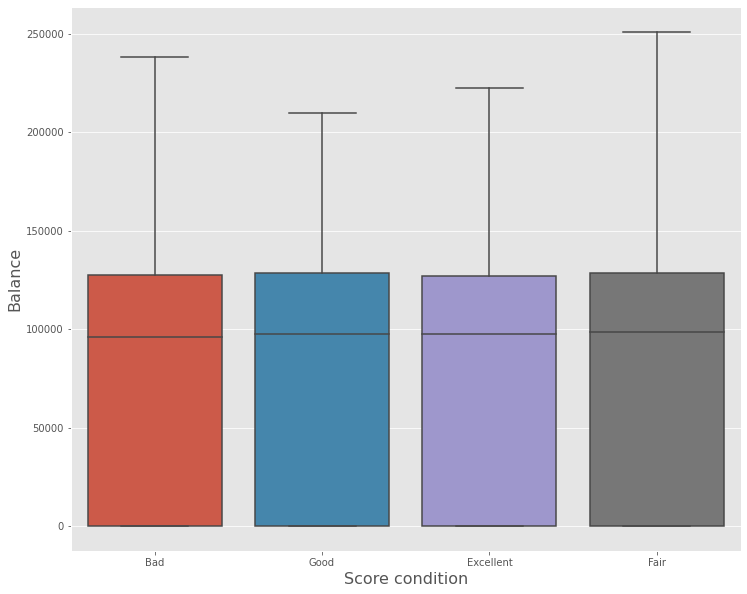

In [27]:
plt.figure(figsize=(12,10))
plt.style.use("ggplot")
boxplot(df=train, x='Score_cond', y='Balance')
plt.xlabel('Score condition')
plt.ylabel('Balance')
plt.show()

This chart is just to check any possible outliers


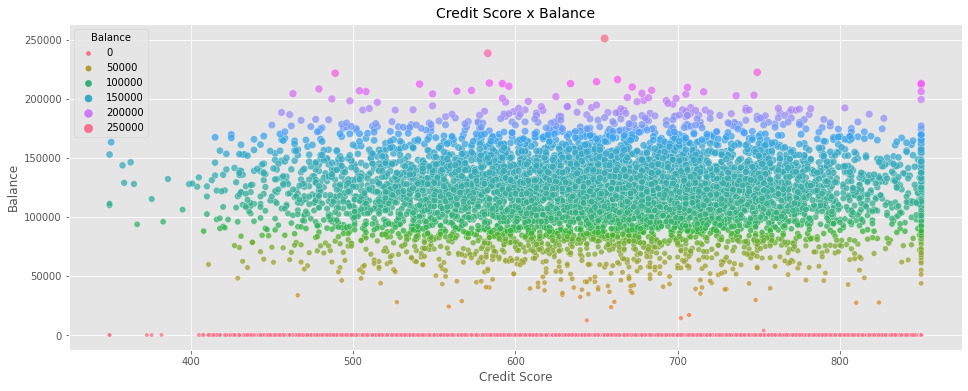

In [28]:
print('This chart is just to check any possible outliers')

# sets plot size
plt.figure(figsize=(16,6))
sns.scatterplot(x='CreditScore', y='Balance', data=train, hue='Balance', size='Balance', palette="husl", alpha=0.75)
plt.xlabel("Credit Score")
plt.ylabel("Balance")
plt.title("Credit Score x Balance", fontsize=14)

# displays the plot
plt.show()

In [29]:
total_creditcard = train[train['Exited']==1]['HasCrCard'].value_counts()
percentage_creditcard = pd.DataFrame(round(total_creditcard/train[train['Exited']==1]['HasCrCard'].value_counts().sum()*100, 2)).rename(columns={'HasCrCard': 'Percentage (%)'})
print('Percentage of the customers in a churn situation according to having a credit card')
percentage_creditcard

Percentage of the customers in a churn situation according to having a credit card


,Percentage (%)
1,69.91
0,30.09


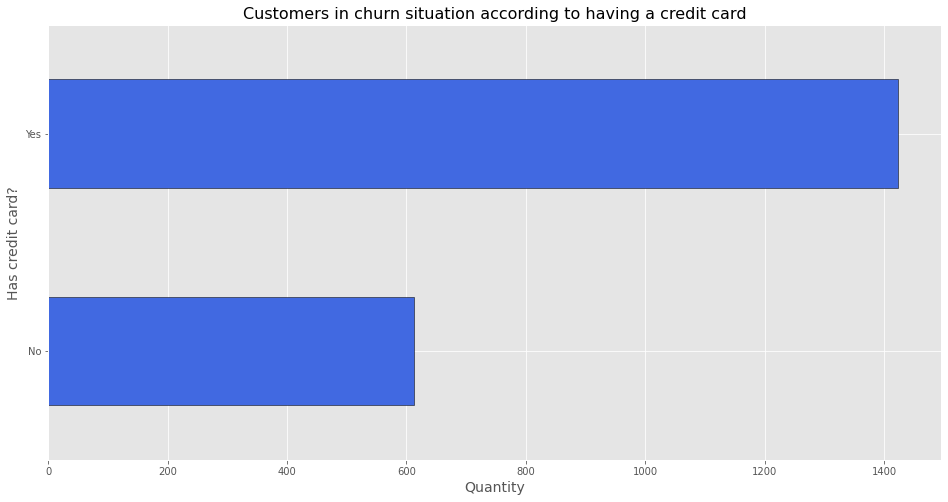

In [30]:
churn_card = train[train['Exited']==1].groupby('HasCrCard').count()
plt.figure(figsize=(16,8))
plt.style.use("ggplot")  
ax = churn_card['Exited'].sort_values(ascending=True).plot(kind='barh', color='royalblue', edgecolor='black')
plt.title('Customers in churn situation according to having a credit card', fontsize=16)
plt.ylabel('Has credit card?', fontsize=14)
plt.xlabel('Quantity', fontsize=14)
plt.yticks(ticks=[0,1], labels=['No','Yes'])
plt.show()

In [31]:
train['Geography'].value_counts()

France     5014
Germany    2509
Spain      2477
Name: Geography, dtype: int64

In [32]:
totaltenure = train[train['Exited']==1]['Tenure'].value_counts()
percentage_tenure = pd.DataFrame(round(totaltenure/train[train['Exited']==1]['Tenure'].value_counts().sum()*100, 2)).rename(columns={'Tenure': 'Percentage (%)'})
print('Percentage of the customers in a churn situation based on the tenure years')
percentage_tenure

Percentage of the customers in a churn situation based on the tenure years


,Percentage (%)
1,11.39
3,10.46
9,10.46
5,10.26
4,9.97
2,9.87
8,9.67
6,9.62
7,8.69
10,4.96


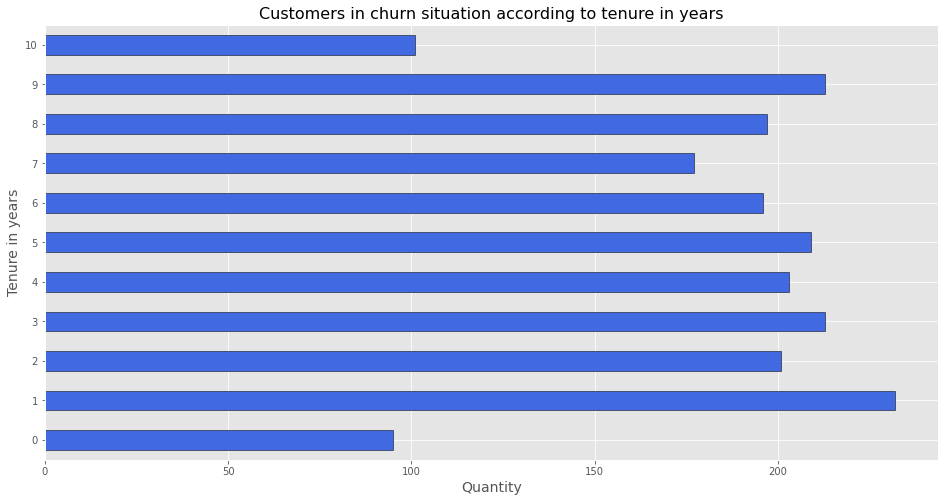

In [33]:
churn_ternure = train[train['Exited']==1].groupby('Tenure').count()
plt.figure(figsize=(16,8))
plt.style.use("ggplot")  
ax = churn_ternure['Exited'].sort_values(ascending=True).plot(kind='barh', color='royalblue', edgecolor='black')
plt.title('Customers in churn situation according to tenure in years', fontsize=16)
plt.ylabel('Tenure in years', fontsize=14)
plt.xlabel('Quantity', fontsize=14)
plt.show()

In [34]:
total_geography = train[train['Exited']==1]['Geography'].value_counts()
percentage_geography = pd.DataFrame(round(total_geography/train[train['Exited']==1]['Geography'].value_counts().sum()*100, 2)).rename(columns={'Geography': 'Percentage (%)'})
print('Percentage of the customers in a churn situation based on the geography')
percentage_geography

Percentage of the customers in a churn situation based on the geography


,Percentage (%)
Germany,39.96
France,39.76
Spain,20.27


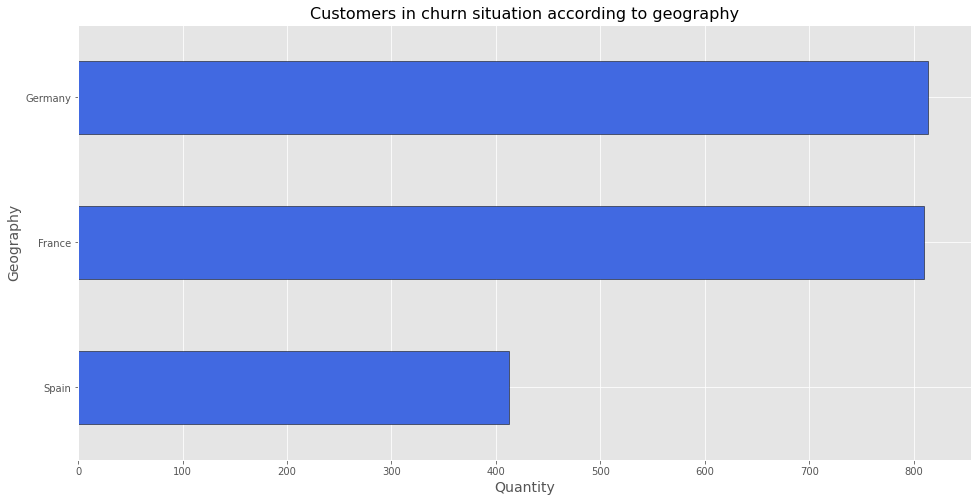

In [35]:
churn_ternure = train[train['Exited']==1].groupby('Geography').count()
plt.figure(figsize=(16,8))
plt.style.use("ggplot")  
ax = churn_ternure['Exited'].sort_values(ascending=True).plot(kind='barh', color='royalblue', edgecolor='black')
plt.title('Customers in churn situation according to geography', fontsize=16)
plt.ylabel('Geography', fontsize=14)
plt.xlabel('Quantity', fontsize=14)
plt.show()

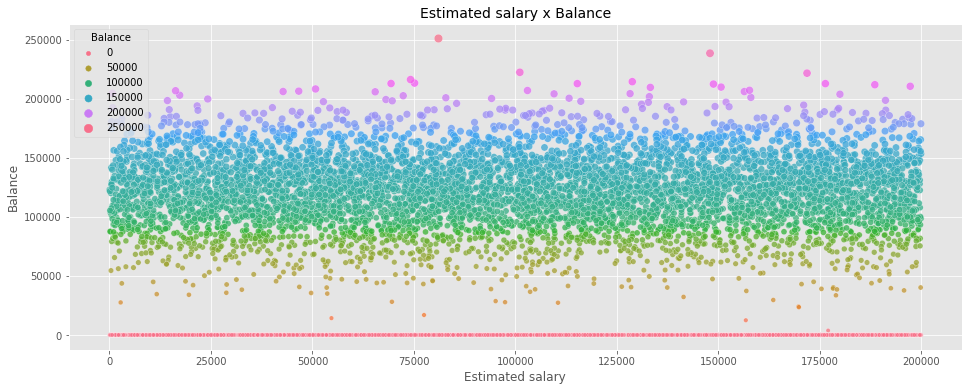

In [36]:
# sets plot size
plt.figure(figsize=(16,6))
sns.scatterplot(x='EstimatedSalary', y='Balance', data=train, hue='Balance', size='Balance', palette="husl", alpha=0.75)
plt.xlabel("Estimated salary")
plt.ylabel("Balance")
plt.title("Estimated salary x Balance", fontsize=14)

# displays the plot
plt.show()

It's possible to see the influence of the balance equal to zero for the customers that aren't in churn situation 


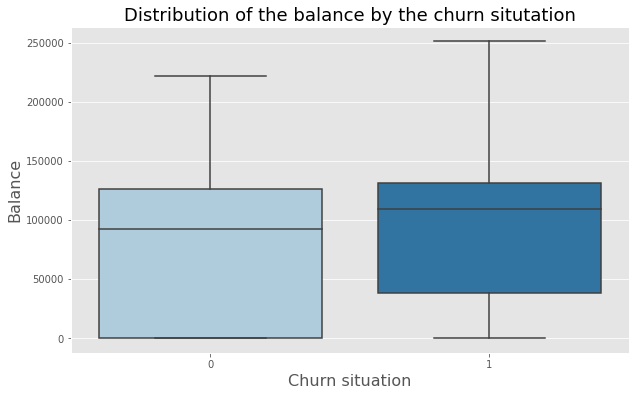

In [37]:
print("It's possible to see the influence of the balance equal to zero for the customers that aren't in churn situation ")
plt.figure(figsize=(10,6))
boxplot(df=train, x='Exited', y='Balance', title='Distribution of the balance by the churn situtation', x_text='Churn situation', y_text='Balance', palette="Paired")
plt.show()

In [38]:
balance_zero = train[train['Exited']==0].query('Balance <10')['Balance'].value_counts()[0]
print('Number of the customers in normal situation with balance less than 10: {}'.format(balance_zero))

Number of the customers in normal situation with balance less than 10: 3117


In [39]:
percentage_balance_zero = round(balance_zero/train[train['Exited']==0].shape[0],2)*100
print('Percentage of the customers in normal situation with balance equal to zero: {}%'.format(percentage_balance_zero))

Percentage of the customers in normal situation with balance equal to zero: 39.0%


In [40]:
customers_less_10_noactive = round(train[train['Exited']==0].query('Balance <10')['IsActiveMember'].value_counts()[0]/train[train['Exited']==0].query('Balance <10')['IsActiveMember'].count(), 2)*100
customers_less_10_active = round(train[train['Exited']==0].query('Balance <10')['IsActiveMember'].value_counts()[1]/train[train['Exited']==0].query('Balance <10')['IsActiveMember'].count(), 2)*100
print('Percentage of the customers with balance less than 10 that are active e non active respectively {} and {}%'.format(customers_less_10_active,customers_less_10_noactive))


Percentage of the customers with balance less than 10 that are active e non active respectively 54.0 and 46.0%


It's possible to see the distribution of the estimated salaries, the customers in both situations have similar distribution


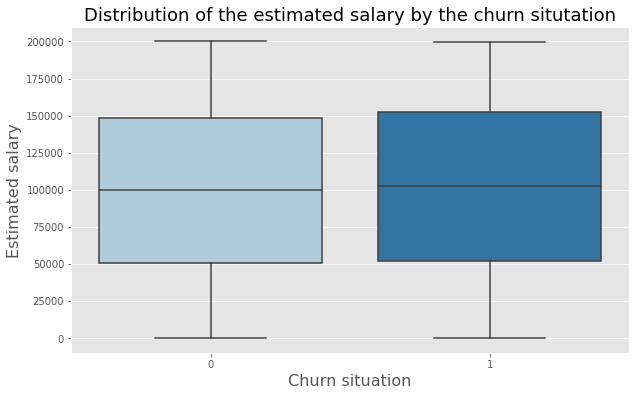

In [41]:
print("It's possible to see the distribution of the estimated salaries, the customers in both situations have similar distribution")
plt.figure(figsize=(10,6))
boxplot(df=train, x='Exited', y='EstimatedSalary', title='Distribution of the estimated salary by the churn situtation', x_text='Churn situation', y_text='Estimated salary', palette="Paired")
plt.show()

In [42]:
train_balance = train.copy()
train_balance['less_10'] = train_balance['Balance'].apply(lambda x: 1 if x<10 else 0)
train_balance_membership = train_balance[['less_10','IsActiveMember']]

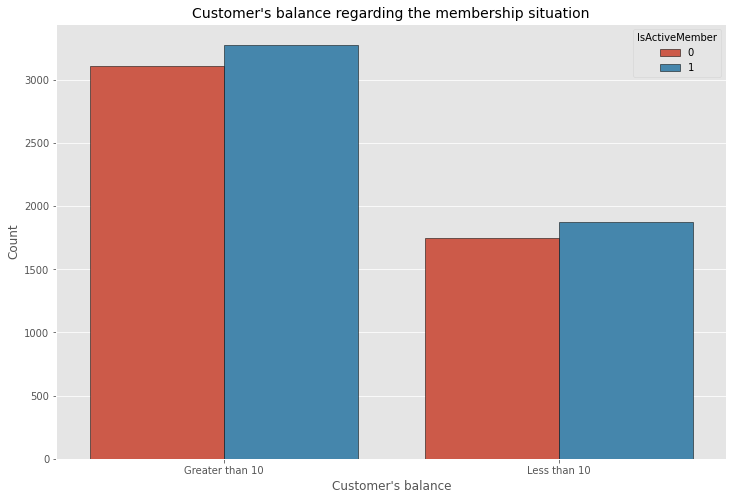

In [43]:
# sets plot size
plt.figure(figsize=(12,8))

# plots countplot
ax = sns.countplot(x='less_10', hue='IsActiveMember', data=train_balance_membership, edgecolor='black')

# sets plot features
plt.title("Customer's balance regarding the membership situation", fontsize=14)
plt.xlabel("Customer's balance")
plt.ylabel("Count")
plt.xticks(ticks=[0,1], labels=['Greater than 10','Less than 10'])


# display plot
plt.show()

### Customers who earn up 1 salary

In [44]:
train[train['EstimatedSalary']<1200]['Score_cond'].value_counts()

Bad          25
Excellent    19
Fair         16
Good          9
Name: Score_cond, dtype: int64

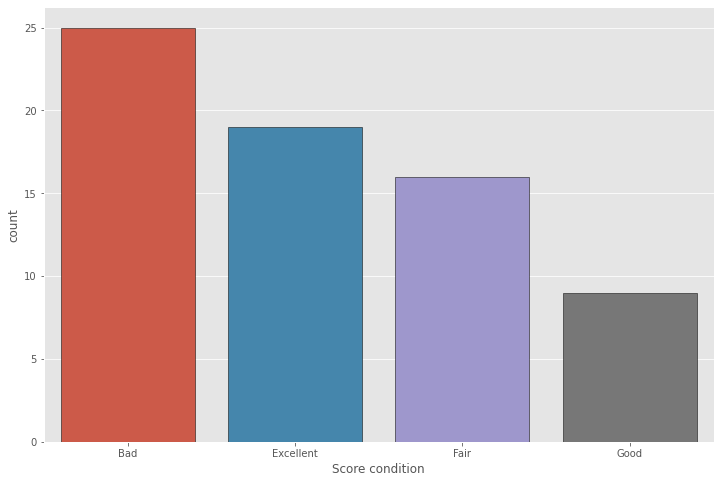

In [45]:
plt.figure(figsize=(12,8))
sns.countplot(train[train['EstimatedSalary']<1200]['Score_cond'], edgecolor='black')
plt.xlabel('Score condition')
plt.show()

In [46]:
train_one_salary = train[train['EstimatedSalary']<1500]

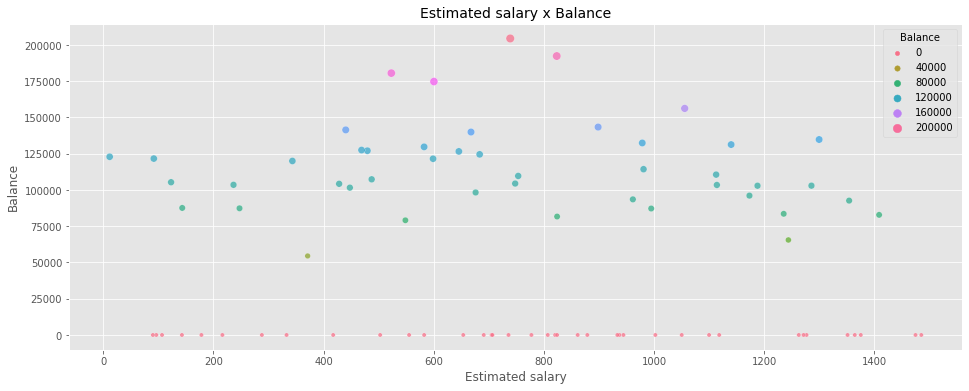

In [47]:
# sets plot size
plt.figure(figsize=(16,6))
sns.scatterplot(x='EstimatedSalary', y='Balance', data=train_one_salary, hue='Balance', size='Balance', palette="husl", alpha=0.75)
plt.xlabel("Estimated salary")
plt.ylabel("Balance")
plt.title("Estimated salary x Balance", fontsize=14)

# displays the plot
plt.show()

In [48]:
print('Number of the customers who earn up 1 salary and with balance equal to zero')
train_one_salary.query('Balance == 0').shape[0]

Number of the customers who earn up 1 salary and with balance equal to zero


38

In [49]:
print('H3: The customers with the lowest salaries tend to be in churn situation --> FALSE')

H3: The customers with the lowest salaries tend to be in churn situation --> FALSE


Most of the customers in churn situation are the youngest ones --> FALSE


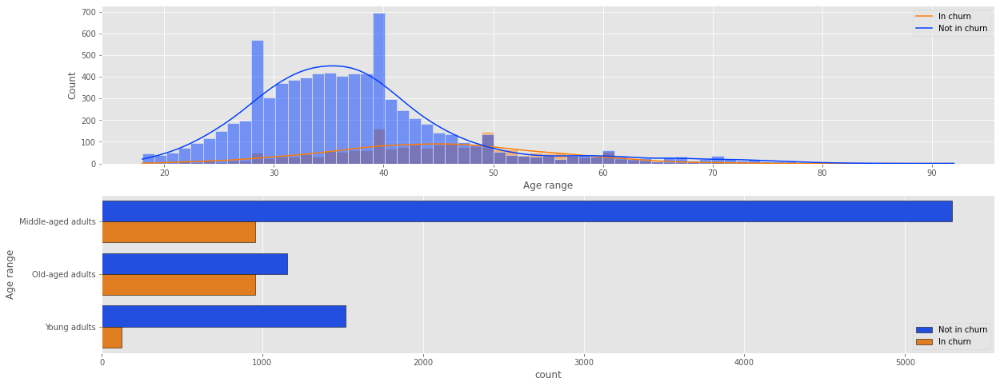

In [50]:
print('Most of the customers in churn situation are the youngest ones --> FALSE')

plt.figure(figsize=(20,8))
plt.subplot(2, 1, 1)
sns.histplot(x='Age', hue='Exited', kde=True, data=train, palette="bright")
plt.xlabel('Age range')
plt.legend(['In churn', 'Not in churn'])

plt.subplot(2, 1, 2)
sns.countplot(y='Age_range', hue='Exited', data=train, edgecolor='black', palette="bright")
plt.ylabel('Age range')
plt.legend(['Not in churn', 'In churn'])

plt.show()

## Multivariate analysis

In [51]:
numerical_variables = ['CreditScore', 'Age', 'Tenure', 'Balance', 'NumOfProducts', 'EstimatedSalary']
train_numerical = train[numerical_variables]

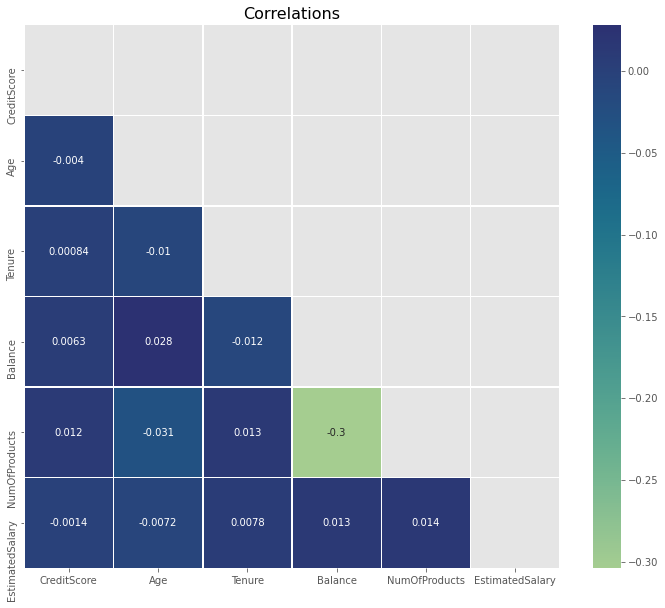

In [52]:
# calculates the correlations
correlations = train_numerical.corr(method='pearson')

# uses the variable ax for single a Axes
fig, ax = plt.subplots()

# sets the figure size in inches
ax.figure.set_size_inches(12, 10)

# generates a mask for the upper triangle
mask = np.triu(np.ones_like(correlations, dtype=np.bool))

# generates a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# plots the heatmap
sns.heatmap(correlations, cmap="crest", mask=mask, linewidths=.5, annot=True)
plt.title('Correlations', fontsize=16)

# displays the plot
plt.show()

# Hypotheses summary

- **H1:** People with bad credit score are the most one in churn situation --> TRUE
- **H2:** Most of the customers are in a good credit score condition --> FALSE
- **H3:** The customers with the lowest salaries tend to be in churn situation --> FALSE
- **H4:** The customers with fewer years of tenure tend to be in a churn situation --> FALSE
- **H5:** The quantity of the customers with balance less than 10 is very low --> FALSE
- **H6:** Most of the customers in churn situation are the youngest ones --> FALSE


# 5.0 Data preparation

In [53]:
train

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Score_cond,Age_range
0,1,15634602,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88,1,Bad,Middle-aged adults
1,2,15647311,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0,Bad,Middle-aged adults
2,3,15619304,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57,1,Bad,Middle-aged adults
3,4,15701354,Boni,699,France,Female,39,1,0.00,2,0,0,93826.63,0,Good,Middle-aged adults
4,5,15737888,Mitchell,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0,Excellent,Middle-aged adults
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,9996,15606229,Obijiaku,771,France,Male,39,5,0.00,2,1,0,96270.64,0,Excellent,Middle-aged adults
9996,9997,15569892,Johnstone,516,France,Male,35,10,57369.61,1,1,1,101699.77,0,Bad,Middle-aged adults
9997,9998,15584532,Liu,709,France,Female,36,7,0.00,1,0,1,42085.58,1,Good,Middle-aged adults
9998,9999,15682355,Sabbatini,772,Germany,Male,42,3,75075.31,2,1,0,92888.52,1,Excellent,Middle-aged adults


In [54]:
from sklearn.preprocessing import LabelEncoder

le= LabelEncoder()

train['Surname'] = le.fit_transform(train['Surname'].values)
pickle.dump(le, open ("parameter/transformation_surname.pkl", "wb"))

train['Geography'] = le.fit_transform(train['Geography'].values)
pickle.dump(le, open ("parameter/transformation_geography.pkl", "wb"))

train['Gender'] = le.fit_transform(train['Gender'].values)
pickle.dump(le, open ("parameter/transformation_gender.pkl", "wb"))

train['Score_cond'] = le.fit_transform(train['Score_cond'].values)
pickle.dump(le, open ("parameter/transformation_score_cond.pkl", "wb"))

train['Age_range'] = le.fit_transform(train['Age_range'].values)
pickle.dump(le, open ("parameter/transformation_age_range.pkl", "wb"))

In [55]:
y = train['Exited']
X = train.drop('Exited', axis=1)

___

# 6.0 Feature Selection

## Feature Selection before oversampling and undersampling

### Boruta

In [96]:
from boruta import BorutaPy
from sklearn.ensemble import RandomForestClassifier

# ###initialize Boruta
# forest = RandomForestClassifier(
#    n_jobs = -1, 
#    max_depth = 5
# )
# boruta = BorutaPy(
#    estimator = forest, 
#    n_estimators = 'auto',
#    max_iter = 100 # number of trials to perform
# )
# ### fit Boruta (it accepts np.array, not pd.DataFrame)
# boruta.fit(np.array(X), np.array(y))
# ### print results
# green_area = X.columns[boruta.support_].to_list()
# blue_area = X.columns[boruta.support_weak_].to_list()
# print('features in the green area:', green_area)
# print('features in the blue area:', blue_area)

### Permutation importance

In [81]:
from sklearn.model_selection import train_test_split

x_train, x_val,y_train, y_val = train_test_split(X, y, test_size=0.3, random_state=72)

In [58]:
# model = RandomForestClassifier(random_state=1).fit(x_train, y_train)
# model.score(x_val, y_val)

In [59]:
# from sklearn.inspection import permutation_importance

# r = permutation_importance(model, x_val, y_val, n_repeats=30,random_state=1)

# for i in r.importances_mean.argsort()[::-1]:
#     if r.importances_mean[i] - 2 * r.importances_std[i] > 0:
#         print(f"{train.columns[i]:<8}"
#         f"{r.importances_mean[i]:.3f}"
#         f" +/- {r.importances_std[i]:.3f}")

## Feature Selection after oversampling have been applied

## - SMOTE (Synthetic Minority Over-sampling Technique)

In [60]:
from imblearn.over_sampling import SMOTE

In [61]:
smt = SMOTE()

In [62]:
X_over, y_over = smt.fit_sample(X, y)

Now the training data is shorter but the classes are balanced


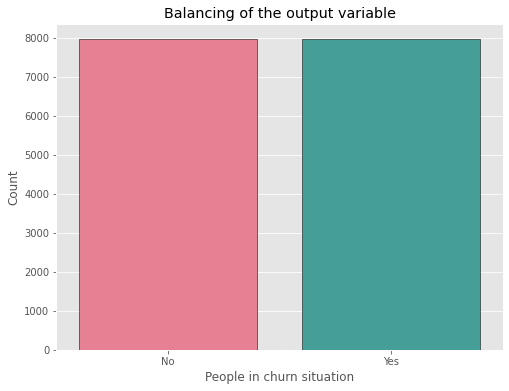

In [63]:
print("Now the training data is shorter but the classes are balanced")

# sets the plot size
plt.figure(figsize=(8,6))

# counts each class for the target var
ax = sns.countplot(x=y_over, palette ="husl", edgecolor="black")

# sets plot features
plt.title("Balancing of the output variable")
plt.xlabel("People in churn situation")
plt.ylabel("Count")
plt.xticks(ticks=[0,1], labels=['No','Yes'])

# displays the plot
plt.show()

In [64]:
print('Lines before the oversampling method: {}'.format(train.shape[0]))
print('Lines after the oversampling method: {}'.format(X_over.shape[0]))

Lines before the oversampling method: 10000
Lines after the oversampling method: 15926


In [65]:
# ###initialize Boruta
# forest = RandomForestClassifier(
#    n_jobs = -1, 
#    max_depth = 5
# )
# boruta = BorutaPy(
#    estimator = forest, 
#    n_estimators = 'auto',
#    max_iter = 100 # number of trials to perform
# )
# ### fit Boruta (it accepts np.array, not pd.DataFrame)
# boruta.fit(np.array(X_over), np.array(y_over))
# ### print results
# green_area = X_over.columns[boruta.support_].to_list()
# blue_area = X_over.columns[boruta.support_weak_].to_list()
# print('features in the green area:', green_area)
# print('features in the blue area:', blue_area)

In [91]:
x_train_over, x_val_over, y_train_over, y_val_over = train_test_split(X_over, y_over, test_size=0.3, random_state=72)

In [67]:
# model_over = RandomForestClassifier(random_state=1).fit(x_train_over, y_train_over)
# model_over.score(x_val_over, y_val_over)

In [68]:
# perm_over = permutation_importance(model_over, x_val_over, y_val_over, n_repeats=30,random_state=1)

# for i in perm_over.importances_mean.argsort()[::-1]:
#     if perm_over.importances_mean[i] - 2 * perm_over.importances_std[i] > 0:
#         print(f"{train.columns[i]:<8}"
#         f"{perm_over.importances_mean[i]:.3f}"
#         f" +/- {perm_over.importances_std[i]:.3f}")

## Feature Selection after undersampling have been applied

## - NearMiss

In [69]:
from imblearn.under_sampling import NearMiss

In [70]:
nr = NearMiss()

In [71]:
X_under, y_under = nr.fit_sample(X, y)

Now the training data is shorter but the classes are balanced


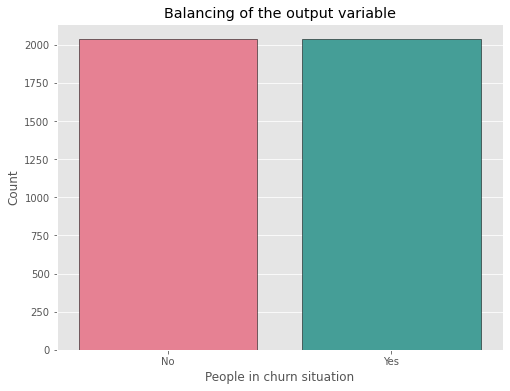

In [72]:
print("Now the training data is shorter but the classes are balanced")

# sets the plot size
plt.figure(figsize=(8,6))

# counts each class for the target var
ax = sns.countplot(x=y_under, palette ="husl", edgecolor="black")

# sets plot features
plt.title("Balancing of the output variable")
plt.xlabel("People in churn situation")
plt.ylabel("Count")
plt.xticks(ticks=[0,1], labels=['No','Yes'])

# displays the plot
plt.show()

In [73]:
print('Lines before the undersampling method: {}'.format(train.shape[0]))
print('Lines after the undersampling method: {}'.format(X_under.shape[0]))

Lines before the undersampling method: 10000
Lines after the undersampling method: 4074


In [74]:
# ###initialize Boruta
# forest = RandomForestClassifier(
#    n_jobs = -1, 
#    max_depth = 5
# )
# boruta = BorutaPy(
#    estimator = forest, 
#    n_estimators = 'auto',
#    max_iter = 100 # number of trials to perform
# )
# ### fit Boruta (it accepts np.array, not pd.DataFrame)
# boruta.fit(np.array(X_under), np.array(y_under))
# ### print results
# green_area = X_under.columns[boruta.support_].to_list()
# blue_area = X_under.columns[boruta.support_weak_].to_list()
# print('features in the green area:', green_area)
# print('features in the blue area:', blue_area)

In [92]:
x_train_under, x_val_under, y_train_under, y_val_under = train_test_split(X_under, y_under, test_size=0.3, random_state=72)

In [76]:
# model_under = RandomForestClassifier(random_state=1).fit(x_train_under, y_train_under)
# model_under.score(x_val_under, y_val_under)

In [77]:
# perm_under = permutation_importance(model_under, x_val_under, y_val_under, n_repeats=30,random_state=1)

# for i in perm_under.importances_mean.argsort()[::-1]:
#     if perm_under.importances_mean[i] - 2 * perm_under.importances_std[i] > 0:
#         print(f"{train.columns[i]:<8}"
#         f"{perm_under.importances_mean[i]:.3f}"
#         f" +/- {perm_under.importances_std[i]:.3f}")

# 7.0 Machine Learning modeling

In [78]:
from sklearn.pipeline import Pipeline
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_validate
from sklearn.model_selection import cross_val_predict

In [79]:
pipe = Pipeline([('scaler', StandardScaler()), ('svc', SVC(probability=True))])

## SVC - Just to check the results with unbalanced output variable. The Recall is the most important metric since we need to make sure the prediction for the class 1 is the priority, which means, the main focus is to check if the customer is in churn situation or not.

In [82]:
SVC = cross_validate(pipe, x_train, y_train, cv=KFold(n_splits = 5, shuffle=True))


In [83]:
y_pred = cross_val_predict(pipe, x_val, y_val, cv=KFold(n_splits = 5, shuffle=True))

In [84]:
from sklearn.metrics import confusion_matrix, classification_report

In [85]:
print(classification_report(y_val, y_pred))

              precision    recall  f1-score   support

           0       0.85      0.98      0.91      2372
           1       0.79      0.32      0.46       628

    accuracy                           0.84      3000
   macro avg       0.82      0.65      0.68      3000
weighted avg       0.83      0.84      0.81      3000



In [86]:
print('The recall is not good for the class 1 --> 0.33')

The recall is not good for the class 1 --> 0.33


___

# SVC | Random Forest | XGBoost + oversampling + without Feature Selection

## - SVC

In [89]:
SVC_over = cross_validate(pipe, x_train, y_train, cv=KFold(n_splits = 5, shuffle=True))
result = np.mean(SVC_over['test_score'])
print('The average accuracy is: {}'.format(round(result,3)))

The average accuracy is: 0.856


In [93]:
y_pred_over = cross_val_predict(pipe, x_val_over, y_val_over, cv=KFold(n_splits = 5, shuffle=True))

In [94]:
print(classification_report(y_val_over, y_pred_over))

              precision    recall  f1-score   support

           0       0.83      0.86      0.85      2343
           1       0.86      0.83      0.85      2435

    accuracy                           0.85      4778
   macro avg       0.85      0.85      0.85      4778
weighted avg       0.85      0.85      0.85      4778



## - Random Forest

In [97]:
RF = RandomForestClassifier()

In [98]:
RF_over = cross_validate(RF, x_train, y_train, cv=KFold(n_splits = 5, shuffle=True))
result_RF_over = np.mean(RF_over['test_score'])
print('The average accuracy is: {}'.format(round(result_RF_over,3)))

The average accuracy is: 0.856


In [99]:
y_pred_rf_over = cross_val_predict(RF, x_val_over, y_val_over, cv=KFold(n_splits = 5, shuffle=True))

In [100]:
print(classification_report(y_val_over, y_pred_rf_over))

              precision    recall  f1-score   support

           0       0.84      0.87      0.86      2343
           1       0.87      0.84      0.86      2435

    accuracy                           0.86      4778
   macro avg       0.86      0.86      0.86      4778
weighted avg       0.86      0.86      0.86      4778



## - XGBoost

In [101]:
import xgboost as xgb

In [102]:
xgb = xgb.XGBClassifier()

In [103]:
xgb_over = cross_validate(xgb, x_train, y_train, cv=KFold(n_splits = 5, shuffle=True))
result_xgb_over = np.mean(xgb_over['test_score'])
print('The average accuracy is: {}'.format(round(result_xgb_over,3)))

[17:31:22] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:31:31] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:31:49] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:32:01] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old be

In [104]:
y_pred_xgb_over = cross_val_predict(xgb, x_val_over, y_val_over, cv=KFold(n_splits = 5, shuffle=True))

[17:32:08] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:32:11] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:32:13] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:32:15] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old be

In [105]:
print(classification_report(y_val_over, y_pred_xgb_over))

              precision    recall  f1-score   support

           0       0.86      0.87      0.87      2343
           1       0.88      0.86      0.87      2435

    accuracy                           0.87      4778
   macro avg       0.87      0.87      0.87      4778
weighted avg       0.87      0.87      0.87      4778



# SVC | Random Forest | XGBoost + Oversampling + Feature Selection from Boruta

In [106]:
X_over_seleted = X[['RowNumber', 'CustomerId', 'Surname', 'CreditScore', 'Geography', 'Gender', 'Age', 'Tenure', 'Balance', 'NumOfProducts', 'HasCrCard', 'IsActiveMember', 'EstimatedSalary', 'Score_cond', 'Age_range']]

In [107]:
X_over_selected, y_over_selected = nr.fit_sample(X_over_seleted, y)

In [108]:
x_train_over_selected, x_val_over_selected, y_train_over_selected, y_val_over_selected = train_test_split(X_over_selected, y_over_selected, test_size=0.3, random_state=72)

## - SVC

In [109]:
SVC_over_selected = cross_validate(pipe, x_train_over_selected, y_train_over_selected, cv=KFold(n_splits = 5, shuffle=True))
result_svc_over_selected = np.mean(SVC_over_selected['test_score'])
print('The average accuracy is: {}'.format(round(result_svc_over_selected,3)))

The average accuracy is: 0.823


In [110]:
y_pred_SVC_over_selected = cross_val_predict(pipe, x_val_over_selected, y_val_over_selected, cv=KFold(n_splits = 5, shuffle=True))

In [111]:
# Accuracy

acc_svc_over_selected = accuracy_score(y_val_over_selected, y_pred_SVC_over_selected)
print("The accuracy of the SVC model is : {}".format(round(acc_svc_over_selected,3)))

The accuracy of the SVC model is : 0.806


In [112]:
print(classification_report(y_val_over_selected, y_pred_SVC_over_selected))

              precision    recall  f1-score   support

           0       0.81      0.81      0.81       635
           1       0.80      0.80      0.80       588

    accuracy                           0.81      1223
   macro avg       0.81      0.81      0.81      1223
weighted avg       0.81      0.81      0.81      1223



## - Random Forest

In [113]:
RF_over_selected = cross_validate(RF, x_train_over_selected, y_train_over_selected, cv=KFold(n_splits = 5, shuffle=True))
result_RF_over_selected = np.mean(RF_over_selected['test_score'])
print('The average accuracy is: {}'.format(round(result_RF_over_selected,3)))

The average accuracy is: 0.842


In [114]:
y_pred_rf_over_selected = cross_val_predict(RF, x_val_over_selected, y_val_over_selected, cv=KFold(n_splits = 5, shuffle=True))

In [115]:
# Accuracy

acc_rf_over_selected = accuracy_score(y_val_over_selected, y_pred_rf_over_selected)
print("The accuracy of the Random Forest model is : {}".format(round(acc_rf_over_selected,3)))

The accuracy of the Random Forest model is : 0.823


In [116]:
print(classification_report(y_val_over_selected, y_pred_rf_over_selected))

              precision    recall  f1-score   support

           0       0.84      0.82      0.83       635
           1       0.81      0.83      0.82       588

    accuracy                           0.82      1223
   macro avg       0.82      0.82      0.82      1223
weighted avg       0.82      0.82      0.82      1223



## - XGBoost

In [117]:
xgb_over_selected = cross_validate(xgb, x_train_over_selected, y_train_over_selected, cv=KFold(n_splits = 5, shuffle=True))
result_xgb_over_selected = np.mean(xgb_over_selected['test_score'])
print('The average accuracy is: {}'.format(round(result_xgb_over_selected,3)))

[17:32:48] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:32:50] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:32:52] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:32:53] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old be

In [118]:
y_pred_xgb_over_selected = cross_val_predict(xgb, x_val_over_selected, y_val_over_selected, cv=KFold(n_splits = 5, shuffle=True))

[17:33:00] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:33:02] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:33:03] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:33:04] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old be

In [119]:
# Prediction accuracy

acc_xgb_over_selected = accuracy_score(y_val_over_selected, y_pred_xgb_over_selected)
print("The accuracy of the XGBoost model is : {}".format(round(acc_xgb_over_selected,3)))

The accuracy of the XGBoost model is : 0.819


In [120]:
print(classification_report(y_val_over_selected, y_pred_xgb_over_selected))

              precision    recall  f1-score   support

           0       0.83      0.82      0.83       635
           1       0.81      0.82      0.81       588

    accuracy                           0.82      1223
   macro avg       0.82      0.82      0.82      1223
weighted avg       0.82      0.82      0.82      1223



___

# SVC | Random Forest | XGBoost + undersampling + without Feature Selection

## - SVC

In [121]:
svc_under = cross_validate(pipe, x_train_under, y_train_under, cv=KFold(n_splits = 5, shuffle=True))
result_svc_under = np.mean(svc_under['test_score'])
print('The average accuracy is: {}'.format(round(result_svc_under,3)))

The average accuracy is: 0.824


In [122]:
y_pred_svc_under = cross_val_predict(pipe, x_val_under, y_val_under, cv=KFold(n_splits = 5, shuffle=True))

In [123]:
print(classification_report(y_val_under, y_pred_svc_under))

              precision    recall  f1-score   support

           0       0.82      0.81      0.81       635
           1       0.80      0.81      0.80       588

    accuracy                           0.81      1223
   macro avg       0.81      0.81      0.81      1223
weighted avg       0.81      0.81      0.81      1223



## - Random Forest

In [124]:
RF_under = cross_validate(RF, x_train_under, y_train_under, cv=KFold(n_splits = 5, shuffle=True))
result_RF_under = np.mean(RF_under['test_score'])
print('The average accuracy is: {}'.format(round(result_RF_under,3)))

The average accuracy is: 0.847


In [125]:
y_pred_rf_under = cross_val_predict(RF, x_val_under, y_val_under, cv=KFold(n_splits = 5, shuffle=True))

In [126]:
# Prediction accuracy

acc_rf_under = accuracy_score(y_val_under, y_pred_rf_under)
print("The accuracy of the Random Forest model is : {}".format(round(acc_rf_under,3)))

The accuracy of the Random Forest model is : 0.818


In [127]:
print(classification_report(y_val_under, y_pred_rf_under))

              precision    recall  f1-score   support

           0       0.83      0.82      0.82       635
           1       0.81      0.82      0.81       588

    accuracy                           0.82      1223
   macro avg       0.82      0.82      0.82      1223
weighted avg       0.82      0.82      0.82      1223



## - XGBoost

In [128]:
xgb_under = cross_validate(xgb, x_train_under, y_train_under, cv=KFold(n_splits = 5, shuffle=True))
result_xgb_under = np.mean(xgb_under['test_score'])
print('The average accuracy is: {}'.format(round(result_xgb_under,3)))

[17:33:31] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:33:35] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:33:36] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:33:40] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old be

In [129]:
y_pred_xgb_under = cross_val_predict(xgb, x_val_under, y_val_under, cv=KFold(n_splits = 5, shuffle=True))

[17:33:47] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:33:49] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:33:50] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:33:52] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old be

In [130]:
# Prediction accuracy

acc_xgb_under = accuracy_score(y_val_under, y_pred_xgb_under)
print("The accuracy of the XGBoost model is : {}".format(round(acc_xgb_under,3)))

The accuracy of the XGBoost model is : 0.81


In [131]:
print(classification_report(y_val_under, y_pred_xgb_under))

              precision    recall  f1-score   support

           0       0.82      0.82      0.82       635
           1       0.80      0.80      0.80       588

    accuracy                           0.81      1223
   macro avg       0.81      0.81      0.81      1223
weighted avg       0.81      0.81      0.81      1223



___

# SVC | Random Forest | XGBoost + Undersampling + Feature Selection from Boruta

In [132]:
X_under_selected = X[['RowNumber', 'CreditScore', 'Geography', 'Gender', 'Age', 'Balance', 'NumOfProducts', 'IsActiveMember', 'Age_range']]

In [133]:
X_under_selected, y_under_selected = nr.fit_sample(X_under_selected, y)

In [134]:
x_train_under_selected, x_val_under_selected, y_train_under_selected, y_val_under_selected = train_test_split(X_under_selected, y_under_selected, test_size=0.3, random_state=72)

## - SVC

In [135]:
svc_under_selected = cross_validate(pipe, x_train_under_selected, y_train_under_selected, cv=KFold(n_splits = 5, shuffle=True))
result_svc_under_selected = np.mean(svc_under_selected['test_score'])
print('The average accuracy is: {}'.format(round(result_svc_under_selected,3)))

The average accuracy is: 0.925


In [136]:
y_pred_svc_under_selected = cross_val_predict(pipe, x_val_under_selected, y_val_under_selected, cv=KFold(n_splits = 5, shuffle=True))

In [137]:
# Prediction accuracy

acc_svc_under_selected = accuracy_score(y_val_under_selected, y_pred_svc_under_selected)
print("The accuracy of the Random Forest model is : {}".format(round(acc_svc_under_selected,3)))

The accuracy of the Random Forest model is : 0.907


In [138]:
print(classification_report(y_val_under_selected, y_pred_svc_under_selected))

              precision    recall  f1-score   support

           0       0.87      0.96      0.91       635
           1       0.96      0.85      0.90       588

    accuracy                           0.91      1223
   macro avg       0.91      0.90      0.91      1223
weighted avg       0.91      0.91      0.91      1223



## - Random Forest

In [139]:
rf_under_selected = cross_validate(RF, x_train_under_selected, y_train_under_selected, cv=KFold(n_splits = 5, shuffle=True))
result_rf_under_selected = np.mean(rf_under_selected['test_score'])
print('The average accuracy is: {}'.format(round(result_rf_under_selected,3)))

The average accuracy is: 0.922


In [140]:
y_pred_rf_under_selected = cross_val_predict(RF, x_val_under_selected, y_val_under_selected, cv=KFold(n_splits = 5, shuffle=True))

In [141]:
# Prediction accuracy

acc_rf_under_selected = accuracy_score(y_val_under_selected, y_pred_rf_under_selected)
print("The accuracy of the Random Forest model is : {}".format(round(acc_rf_under_selected,3)))

The accuracy of the Random Forest model is : 0.915


In [142]:
print(classification_report(y_val_under_selected, y_pred_rf_under_selected))

              precision    recall  f1-score   support

           0       0.90      0.95      0.92       635
           1       0.94      0.88      0.91       588

    accuracy                           0.91      1223
   macro avg       0.92      0.91      0.91      1223
weighted avg       0.92      0.91      0.91      1223



## - XGBoost

In [143]:
xgb_under_selected = cross_validate(xgb, x_train_under_selected, y_train_under_selected, cv=KFold(n_splits = 5, shuffle=True))
result_xgb_under_selected = np.mean(xgb_under_selected['test_score'])
print('The average accuracy is: {}'.format(round(result_xgb_under_selected,3)))

[17:34:17] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:34:18] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:34:19] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:34:20] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old be

In [144]:
y_pred_xgb_under_selected = cross_val_predict(xgb, x_val_under_selected, y_val_under_selected, cv=KFold(n_splits = 5, shuffle=True))

[17:34:23] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:34:25] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:34:26] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:34:26] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old be

In [145]:
# Prediction accuracy

acc_xgb_under_selected = accuracy_score(y_val_under_selected, y_pred_xgb_under_selected)
print("The accuracy of the Random Forest model is : {}".format(round(acc_xgb_under_selected,3)))

The accuracy of the Random Forest model is : 0.893


In [146]:
print(classification_report(y_val_under_selected, y_pred_xgb_under_selected))

              precision    recall  f1-score   support

           0       0.89      0.91      0.90       635
           1       0.90      0.87      0.89       588

    accuracy                           0.89      1223
   macro avg       0.89      0.89      0.89      1223
weighted avg       0.89      0.89      0.89      1223



## - Baseline (Dummy Classifier)

In [147]:
from sklearn.dummy import DummyClassifier

# Dummy classifie + Undersampling
SEED = 5
dummy = DummyClassifier(strategy="most_frequent", random_state=SEED)
dummy.fit(x_train_under_selected, y_train_under_selected)
predictions_dummy_under = dummy.predict(x_val_under_selected)

accuracy_under = accuracy_score(y_val_under_selected, predictions_dummy_under) * 100
print("The accuracy of the dummy classifier is %.2f%%" % accuracy_under)

The accuracy of the dummy classifier is 48.08%


In [148]:
print(classification_report(y_val_under_selected, predictions_dummy_under))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       635
           1       0.48      1.00      0.65       588

    accuracy                           0.48      1223
   macro avg       0.24      0.50      0.32      1223
weighted avg       0.23      0.48      0.31      1223



___

## Best model

### Fine tuning using the best model (Random Forest with undersampling and feature selection from Boruta)

In [149]:
param_grid = {"n_estimators": [100,200,400],
              "max_depth": [4,5,6]} 
RF_grid_selected = GridSearchCV(RF, cv=KFold(n_splits = 5, shuffle=True), param_grid=param_grid, scoring='accuracy')
RF_grid_selected.fit(x_train_under_selected, y_train_under_selected)
best_RF_selected = RF_grid_selected.best_estimator_

print(best_RF_selected)

RandomForestClassifier(max_depth=6)


In [150]:
y_pred_rf_best_model = best_RF_selected.predict(x_val_under_selected)

In [151]:
print(classification_report(y_val_under_selected, y_pred_rf_best_model))

              precision    recall  f1-score   support

           0       0.88      0.97      0.93       635
           1       0.97      0.86      0.91       588

    accuracy                           0.92      1223
   macro avg       0.92      0.92      0.92      1223
weighted avg       0.92      0.92      0.92      1223



In [152]:
from sklearn.metrics import plot_confusion_matrix

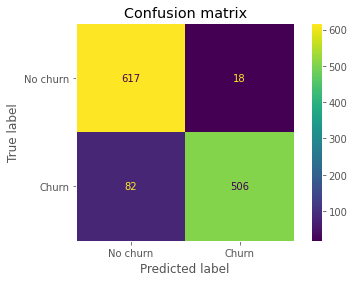

In [153]:
plot_confusion_matrix(best_RF_selected, x_val_under_selected, y_val_under_selected) 
plt.title('Confusion matrix')
plt.yticks(ticks=[0,1], labels=['No churn','Churn'])
plt.xticks(ticks=[0,1], labels=['No churn','Churn'])
plt.grid(False)
plt.show()

___

## AUC-ROC Curve

In [154]:
from sklearn.pipeline import make_pipeline
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve

make_pipeline(StandardScaler(), SVC(gamma='auto'))
svc_clf = make_pipeline(StandardScaler(), SVC(gamma='auto', probability=True))

[17:35:36] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
No Skill: ROC AUC=0.500
Random Forest: ROC AUC=0.969
SVC: ROC AUC=0.967
XGBoost: ROC AUC=0.963


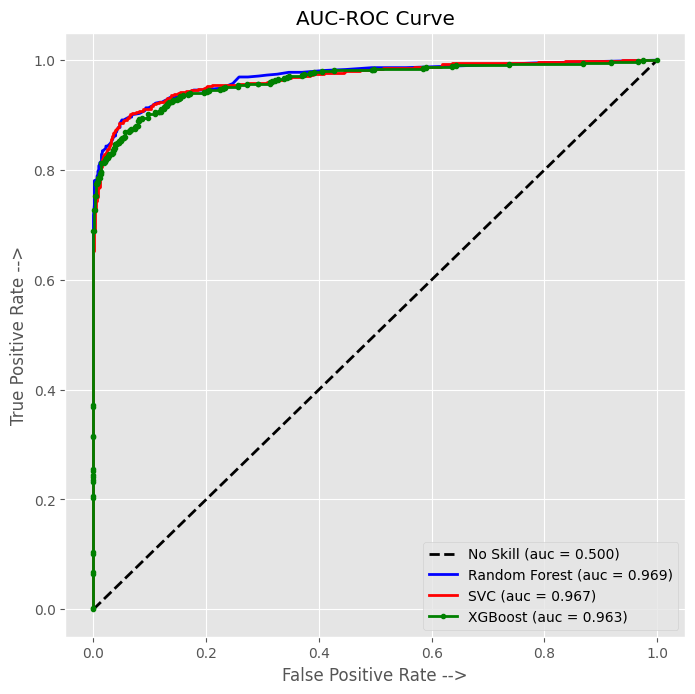

In [155]:
ns_probs = [0 for _ in range(len(y_val_under_selected))]


# fit a model
SEED=1

rf_clf = RandomForestClassifier(random_state=SEED)
#svc_clf = SVC(random_state=SEED)
xgb_clf = XGBClassifier(random_state=SEED)


# trains the classifiers
rf_clf.fit(x_train_under_selected, y_train_under_selected)
svc_clf.fit(x_train_under_selected, y_train_under_selected)
xgb_clf.fit(x_train_under_selected, y_train_under_selected)


# predict probabilities
rf_probs = rf_clf.predict_proba(x_val_under_selected)
svc_probs = svc_clf.predict_proba(x_val_under_selected)
xgb_probs = xgb_clf.predict_proba(x_val_under_selected)


# keep probabilities for the positive outcome only
rf_probs = rf_probs[:, 1]
svc_probs = svc_probs[:, 1]
xgb_probs = xgb_probs[:, 1]


# calculate scores
ns_auc = roc_auc_score(y_val_under_selected, ns_probs)
rf_auc = roc_auc_score(y_val_under_selected, rf_probs)
svc_auc = roc_auc_score(y_val_under_selected, svc_probs)
xgb_auc = roc_auc_score(y_val_under_selected, xgb_probs)


# summarize scores
print('No Skill: ROC AUC=%.3f' % (ns_auc))
print('Random Forest: ROC AUC=%.3f' % (rf_auc))
print('SVC: ROC AUC=%.3f' % (svc_auc))
print('XGBoost: ROC AUC=%.3f' % (xgb_auc))


# calculate roc curves
ns_fpr, ns_tpr, _ = roc_curve(y_val_under_selected, ns_probs)
rf_fpr, rf_tpr, _ = roc_curve(y_val_under_selected, rf_probs)
svc_fpr, svc_tpr, _ = roc_curve(y_val_under_selected, svc_probs)
xgb_fpr, xgb_tpr, _ = roc_curve(y_val_under_selected, xgb_probs)


# plot the roc curve for the model
plt.figure(figsize=(8,8), dpi=100)

plt.plot(ns_fpr, ns_tpr, linestyle='dashed', linewidth=2, color= 'black', label='No Skill (auc = %0.3f)' % ns_auc)
plt.plot(rf_fpr, rf_tpr, linestyle='-', linewidth=2, color= 'blue', label='Random Forest (auc = %0.3f)' % rf_auc)
plt.plot(svc_fpr, svc_tpr, linestyle='-', linewidth=2, color= 'red', label='SVC (auc = %0.3f)' % svc_auc)
plt.plot(xgb_fpr, xgb_tpr, marker='.', linewidth=2, color= 'green', label='XGBoost (auc = %0.3f)' % xgb_auc)


# axis label
plt.xlabel('False Positive Rate -->')
plt.ylabel('True Positive Rate -->')
plt.title("AUC-ROC Curve")
plt.legend()

plt.show()

___

# 8.0 Deploy model to production

### Save trained model

In [ ]:
# pickle.dump(best_RF_selected, open("model/model_best_rf_selected.pkl", "wb"))

## API Tester

### This is the API tester to check if everything is working before deployment in Heroku

In [11]:
import json
import requests

In [12]:
df_test = pd.read_csv('test_churn.csv')

In [13]:
data = json.dumps(df_test.to_dict(orient='records'))

In [14]:
# API Call

#url = 'http://0.0.0.0:5000/churn/predict' # Local deploy
url = 'https://churn-prediction-deploy.herokuapp.com/churn/predict' # Deploy by Heroku (The application is already created)
header = {'Content-type': 'application/json'}
data = data


r = requests.post(url, data=data, headers=header)
print('Status code {}'.format(r.status_code))

Status code 200


In [15]:
d1 = pd.DataFrame(r.json(), columns=r.json()[0].keys())

## References

https://www.investopedia.com/terms/c/churnrate.asp

https://nextommerce.com/churn-rate-benchmarks/

https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html

https://scikit-learn.org/stable/modules/generated/sklearn.pipeline.Pipeline.html

https://scikit-learn.org/stable/auto_examples/model_selection/plot_roc.html

https://machinelearningmastery.com/roc-curves-and-precision-recall-curves-for-classification-in-python/

https://machinelearningmastery.com/develop-first-xgboost-model-python-scikit-learn/

https://scikit-learn.org/stable/modules/permutation_importance.html